In [1]:
import os
import zipfile
import random
import numpy as np
import tensorflow as tf
import keras
from scipy import interp
from itertools import cycle
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import roc_curve, auc
from shutil import copyfile
from keras.callbacks import EarlyStopping
import time
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications.inception_v3 import InceptionV3
from sklearn.metrics import roc_curve, auc
from sklearn import metrics
import pandas as pd
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from platform import python_version_tuple
import matplotlib.image  as mpimg
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
local_zip = 'Papaya_Disease.zip'
zip_ref   = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('tmp')
zip_ref.close()

Creating Directoris for splitting Train & Validation Data

In [3]:
try:
  os.mkdir('tmp/papaya')
  os.mkdir('tmp/papaya/training')
  os.mkdir('tmp/papaya/validation')
  os.mkdir('tmp/papaya/test')
  os.mkdir('tmp/papaya/training/anthracnose')
  os.mkdir('tmp/papaya/training/black_spot')
  os.mkdir('tmp/papaya/training/phytophthora')
  os.mkdir('tmp/papaya/training/powdery_mildew')
  os.mkdir('tmp/papaya/training/ring_spot')
  os.mkdir('tmp/papaya/validation/anthracnose')
  os.mkdir('tmp/papaya/validation/black_spot')
  os.mkdir('tmp/papaya/validation/phytophthora')
  os.mkdir('tmp/papaya/validation/powdery_mildew')
  os.mkdir('tmp/papaya/validation/ring_spot')
  os.mkdir('tmp/papaya/test/anthracnose')
  os.mkdir('tmp/papaya/test/black_spot')
  os.mkdir('tmp/papaya/test/phytophthora')
  os.mkdir('tmp/papaya/test/powdery_mildew')
  os.mkdir('tmp/papaya/test/ring_spot')
except OSError:
    pass  


In [4]:
test_dataset = 'test.zip'
test_dataset_ref   = zipfile.ZipFile(test_dataset, 'r')
test_dataset_ref.extractall('tmp/papaya')
test_dataset_ref.close()

Function for splitting data

In [5]:
def split_data(SOURCE, TRAINING, VALIDATION, SPLIT_SIZE):
    files = []
    for filename in os.listdir(SOURCE):
        file = SOURCE + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
        else:
            print(filename + " is zero length, so ignoring.")

    training_length = int(len(files) * SPLIT_SIZE)
    validation_length = int(len(files) - training_length)
    shuffled_set = random.sample(files, len(files))
    training_set = shuffled_set[0:training_length]
    validation_set = shuffled_set[:validation_length]

    for filename in training_set:
        this_file = SOURCE + filename
        destination = TRAINING + filename
        copyfile(this_file, destination)

    for filename in validation_set:
        this_file = SOURCE + filename
        destination = VALIDATION + filename
        copyfile(this_file, destination)


ANTHRACNOSE_SOURCE_DIR = "tmp/Papaya_Disease/anthracnose/"
TRAINING_ANTHRACNOSE_DIR = "tmp/papaya/training/anthracnose/"
VALIDATION_ANTHRACNOSE_DIR = "tmp/papaya/validation/anthracnose/"

BLACK_SPOT_SOURCE_DIR = "tmp/Papaya_Disease/black_spot/"
TRAINING_BLACK_SPOT_DIR = "tmp/papaya/training/black_spot/"
VALIDATION_BLACK_SPOT_DIR = "tmp/papaya/validation/black_spot/"

PHYTOPHTHORA_SOURCE_DIR = "tmp/Papaya_Disease/phytophthora/"
TRAINING_PHYTOPHTHORA_DIR = "tmp/papaya/training/phytophthora/"
VALIDATION_PHYTOPHTHORA_DIR = "tmp/papaya/validation/phytophthora/"

POWDERY_MILDEW_SOURCE_DIR = "tmp/Papaya_Disease/powdery_mildew/"
TRAINING_POWDERY_MILDEW_DIR = "tmp/papaya/training/powdery_mildew/"
VALIDATION_POWDERY_MILDEW_DIR = "tmp/papaya/validation/powdery_mildew/"

RING_SPOT_SOURCE_DIR = "tmp/Papaya_Disease/ring_spot/"
TRAINING_RING_SPOT_DIR = "tmp/papaya/training/ring_spot/"
VALIDATION_RING_SPOT_DIR = "tmp/papaya/validation/ring_spot/"

split_size = .7
split_data(ANTHRACNOSE_SOURCE_DIR, TRAINING_ANTHRACNOSE_DIR, VALIDATION_ANTHRACNOSE_DIR, split_size)
split_data(BLACK_SPOT_SOURCE_DIR, TRAINING_BLACK_SPOT_DIR, VALIDATION_BLACK_SPOT_DIR, split_size)
split_data(PHYTOPHTHORA_SOURCE_DIR, TRAINING_PHYTOPHTHORA_DIR, VALIDATION_PHYTOPHTHORA_DIR, split_size)
split_data(POWDERY_MILDEW_SOURCE_DIR, TRAINING_POWDERY_MILDEW_DIR, VALIDATION_POWDERY_MILDEW_DIR, split_size)
split_data(RING_SPOT_SOURCE_DIR, TRAINING_RING_SPOT_DIR, VALIDATION_RING_SPOT_DIR, split_size)

In [6]:
# Create an instance of the inception model from the local pre-trained weights
local_weights_file = 'tmp/inceptionV3_15_09_21.h5'

pre_trained_model = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False, 
                                weights = None,
                                )

# Make all the layers in the pre-trained model non-trainable
for layer in pre_trained_model.layers:
  layer.trainable = False
  
#pre_trained_model.summary()

Set 'mixed7' as last layer, after that we include our own layers

In [7]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 7, 7, 768)


In [8]:
# Flatten the output layer to 1 dimension
x = layers.GlobalAveragePooling2D()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.4
x = layers.Dropout(0.4)(x)                  
# Add a final softmax layer for classification
x = layers.Dense  (5, activation='softmax')(x)           

model = Model( pre_trained_model.input, x) 
model.load_weights(local_weights_file)
#model.get_weights()

In [9]:
model.compile(optimizer = Adam(learning_rate=0.0001), 
              loss = 'categorical_crossentropy', 
              metrics = ['accuracy'])

#model.summary()

In [10]:
TRAINING_DIR = "tmp/papaya/training/"
VALIDATION_DIR = "tmp/papaya/validation/"
TEST_DIR = "tmp/papaya/test/"

train_datagen = ImageDataGenerator(rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')
train_generator = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=16,
                                                    class_mode='categorical',
                                                    target_size=(150, 150))


validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                              batch_size=16,
                                                              class_mode='categorical',
                                                              target_size=(150, 150))


test_datagen = ImageDataGenerator(rescale=1./255,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2)
test_generator = test_datagen.flow_from_directory(TEST_DIR,
                                                              batch_size=16,
                                                              class_mode='categorical',
                                                              target_size=(150, 150))

Found 869 images belonging to 5 classes.
Found 374 images belonging to 5 classes.
Found 207 images belonging to 5 classes.


In [11]:
class TimeHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

In [12]:
time_callback = TimeHistory()
es= EarlyStopping(monitor='loss', mode='min',patience=2)
history = model.fit(train_generator,
                              epochs=2,
                              verbose=1,
                              validation_data=validation_generator,
                              callbacks=[es,time_callback])

Epoch 1/2
55/55 [==============================] - 37s 548ms/step - loss: 0.0581 - accuracy: 0.9804 - val_loss: 0.0583 - val_accuracy: 0.9706
Epoch 2/2
55/55 [==============================] - 20s 356ms/step - loss: 0.0385 - accuracy: 0.9862 - val_loss: 0.0532 - val_accuracy: 0.9706


In [ ]:
model.save_weights('tmp/inceptionV3_14_09_21.h5')

In [13]:
times = time_callback.times
print(sum(times))

56.806652307510376


<Figure size 432x288 with 0 Axes>

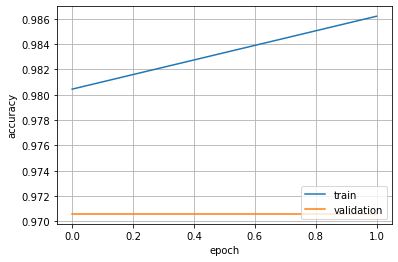

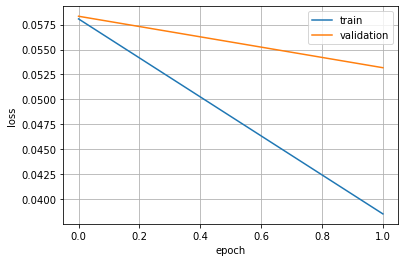

<Figure size 432x288 with 0 Axes>

In [14]:
%matplotlib inline

# Retrieve a list of list results on training and validation data
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']

epochs=range(len(acc)) # Get number of epochs

# Plot training and validation accuracy per epoch
plt.plot(acc)
plt.plot(val_acc)
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.grid(axis = 'x')
plt.grid(axis = 'y')
plt.figure()

# Plot training and validation loss per epoch
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.grid(axis = 'x')
plt.grid(axis = 'y')
plt.figure()

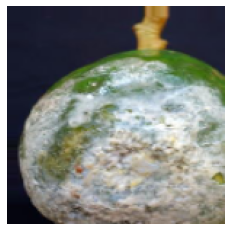

true label:phytophthora
predicted label:phytophthora


In [15]:
def get_class_string_from_index(index):
    for class_string,class_index in test_generator.class_indices.items():
        if class_index==index:
            return class_string
x,y=next(test_generator)
image=x[0,:,:,:]
true_index=np.argmax(y[0])
plt.imshow(image)
plt.axis('off')
plt.show()

prediction_scores=model.predict(np.expand_dims(image,axis=0))
predicted_index=np.argmax(prediction_scores)
print("true label:"+get_class_string_from_index(true_index))
print("predicted label:"+get_class_string_from_index(predicted_index))

In [16]:
train_anthracnose_fnames= os.listdir(TRAINING_ANTHRACNOSE_DIR)
train_black_spot_fnames= os.listdir(TRAINING_BLACK_SPOT_DIR)
train_phytophthora_fnames= os.listdir(TRAINING_PHYTOPHTHORA_DIR)
train_powdery_mildew_fnames= os.listdir(TRAINING_POWDERY_MILDEW_DIR)
train_ring_spot_fnames= os.listdir(TRAINING_RING_SPOT_DIR)

<ipython-input-17-98fae106e333>:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure( figsize=(scale * n_features, scale) )
<ipython-input-17-98fae106e333>:56: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()


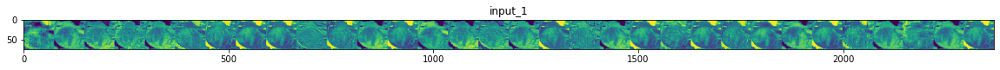

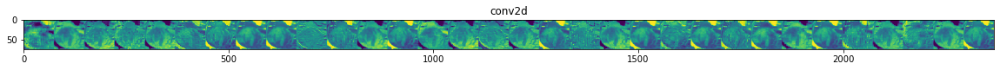

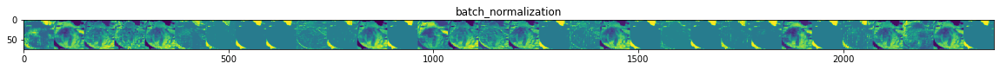

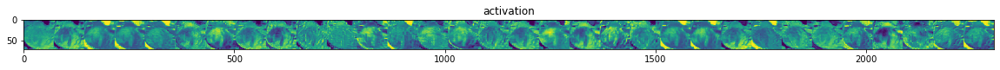

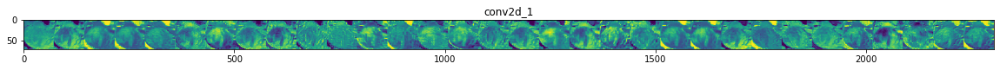

...

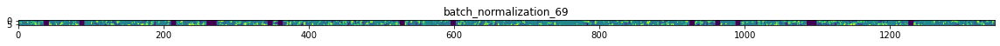

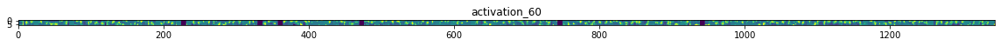

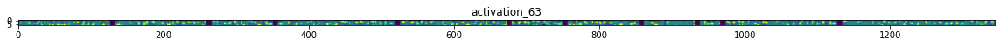

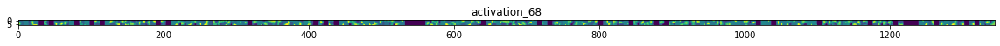

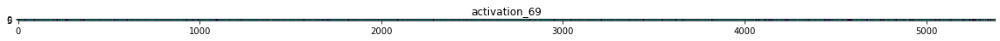

In [17]:
# Let's define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.
successive_outputs = [layer.output for layer in model.layers[1:]]

#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

# Let's prepare a random input image of a cat or dog from the training set.
anthracnose_img_files = [os.path.join(TRAINING_ANTHRACNOSE_DIR, f) for f in train_anthracnose_fnames]
black_spot_img_files = [os.path.join(TRAINING_BLACK_SPOT_DIR, f) for f in train_black_spot_fnames]
phytophthora_img_files = [os.path.join(TRAINING_PHYTOPHTHORA_DIR, f) for f in train_phytophthora_fnames]
powdery_mildew_img_files = [os.path.join(TRAINING_POWDERY_MILDEW_DIR, f) for f in train_powdery_mildew_fnames]
ring_spot_img_files = [os.path.join(TRAINING_RING_SPOT_DIR, f) for f in train_ring_spot_fnames]

img_path = random.choice(anthracnose_img_files + black_spot_img_files 
                          + phytophthora_img_files 
                         + powdery_mildew_img_files + ring_spot_img_files)
img = load_img(img_path, target_size=(150, 150))  # this is a PIL image

x   = img_to_array(img)                           # Numpy array with shape (150, 150, 3)
x   = x.reshape((1,) + x.shape)                   # Numpy array with shape (1, 150, 150, 3)

# Rescale by 1/255
x /= 255.0

# Let's run our image through our network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]

# -----------------------------------------------------------------------
# Now let's display our representations
# -----------------------------------------------------------------------
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  
  if len(feature_map.shape) == 4:
    
    #-------------------------------------------
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    #-------------------------------------------
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    #-------------------------------------------------
    # Postprocess the feature to be visually palatable
    #-------------------------------------------------
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size : (i + 1) * size] = x # Tile each filter into a horizontal grid

    #-----------------
    # Display the grid
    #-----------------

    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' ) 

Extract data & labels from generator

In [18]:
if python_version_tuple()[0] == '3':
    xrange = range
    izip = zip
    imap = map
else:
    from itertools import izip, imap

import numpy as np

x_train, y_train = izip(*(train_generator[i] for i in xrange(len(train_generator))))
train_data, train_labels = np.vstack(x_train), np.vstack(y_train)

x_val, y_val = izip(*(validation_generator[i] for i in xrange(len(validation_generator))))
validation_data, validation_labels = np.vstack(x_val), np.vstack(y_val)

x_test, y_test = izip(*(test_generator[i] for i in xrange(len(test_generator))))
test_data, test_labels = np.vstack(x_test), np.vstack(y_test)

In [19]:
model.evaluate(test_data,test_labels)

7/7 [==============================] - 9s 589ms/step - loss: 0.0603 - accuracy: 0.9903


[0.06028662621974945, 0.990338146686554]

In [20]:
preds = np.round(model.predict(test_data),0)
categorical_test_labels = pd.DataFrame(test_labels).idxmax(axis=1)
categorical_preds = pd.DataFrame(preds).idxmax(axis=1)

In [21]:
disease = ['anthracnose','black_spot','phytophthora','powdery_mildew','ring_spot']
cm = metrics.classification_report(test_labels,preds,target_names = disease)
print(cm)

                precision    recall  f1-score   support

   anthracnose       1.00      1.00      1.00        53
    black_spot       1.00      0.93      0.96        27
  phytophthora       1.00      1.00      1.00        35
powdery_mildew       1.00      0.98      0.99        41
     ring_spot       0.96      1.00      0.98        51

     micro avg       0.99      0.99      0.99       207
     macro avg       0.99      0.98      0.99       207
  weighted avg       0.99      0.99      0.99       207
   samples avg       0.99      0.99      0.99       207



C:\Users\TANVIR\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**pred and y_pred has different prediction value**

In [22]:
Y_pred = model.predict(test_data)
y_pred = np.argmax(Y_pred, axis=1)

In [23]:
n_classes=5
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels[:, i],Y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

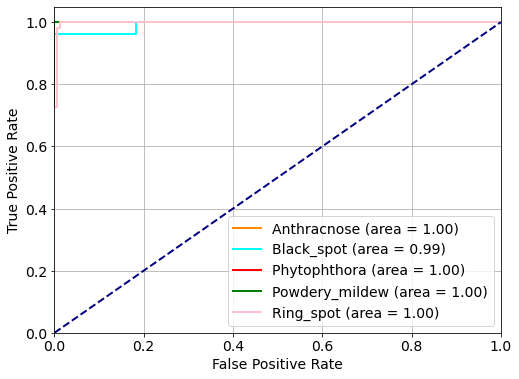

In [24]:
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(test_labels.ravel(), Y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
lw = 2
plt.figure(figsize=(8, 6))
plt.rcParams.update({'font.size': 14})
plt.grid()
plt.plot(fpr[0], tpr[0], color='darkorange',
lw=lw, label='Anthracnose (area = %0.2f)' % roc_auc[0])
plt.plot(fpr[1], tpr[1], color='aqua',
lw=lw, label='Black_spot (area = %0.2f)' % roc_auc[1])
plt.plot(fpr[2], tpr[2], color='red',
lw=lw, label='Phytophthora (area = %0.2f)' % roc_auc[2])
plt.plot(fpr[3], tpr[3], color='green',
lw=lw, label='Powdery_mildew (area = %0.2f)' % roc_auc[3])
plt.plot(fpr[4], tpr[4], color='pink',
lw=lw, label='Ring_spot (area = %0.2f)' % roc_auc[4])

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()


**Confusion Matrix**


[[53  0  0  0  0]
 [ 1 25  0  0  1]
 [ 0  0 35  0  0]
 [ 0  0  0 40  1]
 [ 0  0  0  0 51]]


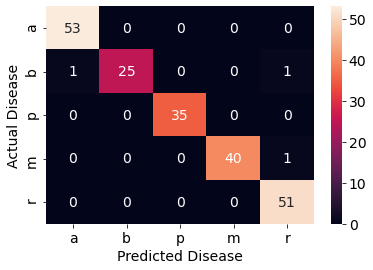

In [25]:
## Create the Confusion Matrix out of the Actual and Predicted Data.
cm = confusion_matrix(categorical_test_labels, categorical_preds)


## Print the Confusion Matrix
print(cm)

## Call the heatmap() function from the Seaborn Library.
## annot=True annotates cells.
## fmt='g' disables scientific notation.
## The heatmap() function returns a Matplotlib Axes Object.
ax = sns.heatmap(cm, annot=True, fmt='g');

## Modify the Axes Object directly to set various attributes such as the
## Title, X/Y Labels.
# ax.set_title('Seaborn Confusion Matrix with labels!!');
ax.set_xlabel('Predicted Disease')
ax.set_ylabel('Actual Disease');

## For the Tick Labels, the labels should be in Alphabetical order
ax.xaxis.set_ticklabels(['a','b','p','m','r'])
ax.yaxis.set_ticklabels(['a','b','p','m','r'])

## Finally call the matplotlib show() function to display the visualization
## of the Confusion Matrix.
plt.show()

**Transfer Learning**

In [20]:
# Import the inception model  

pre_trained_model_transfer = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False, 
                                weights = 'imagenet',
                                )

# Make all the layers in the pre-trained model non-trainable
for layer in pre_trained_model_transfer.layers:
  layer.trainable = False
  
#pre_trained_model_transfer.summary()

In [21]:
last_layer_transfer = pre_trained_model_transfer.get_layer('mixed7')
print('last layer output shape: ', last_layer_transfer.output_shape)
last_output_transfer = last_layer_transfer.output

last layer output shape:  (None, 7, 7, 768)


In [22]:
x_transfer = layers.GlobalAveragePooling2D()(last_output_transfer)
x_transfer = layers.Dense(1024, activation='relu')(x_transfer)
x_transfer = layers.Dropout(0.4)(x_transfer)                  
x_transfer = layers.Dense (5, activation='softmax')(x_transfer)           

model_transfer = Model( pre_trained_model_transfer.input, x_transfer) 

In [23]:
model_transfer.compile(optimizer = Adam(learning_rate=0.0001), 
              loss = 'categorical_crossentropy', 
              metrics = ['accuracy'])

#model.summary()

In [24]:
TRAINING_DIR = "tmp/papaya/training/"
VALIDATION_DIR = "tmp/papaya/validation/"
TEST_DIR = "tmp/papaya/test/"

train_datagen_transfer = ImageDataGenerator(rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')
train_generator_transfer = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=16,
                                                    class_mode='categorical',
                                                    target_size=(150, 150))


validation_datagen_transfer = ImageDataGenerator(rescale=1./255)
validation_generator_transfer = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                              batch_size=16,
                                                              class_mode='categorical',
                                                              target_size=(150, 150))


test_datagen_transfer = ImageDataGenerator(rescale=1./255,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2)
test_generator_transfer = test_datagen.flow_from_directory(TEST_DIR,
                                                              batch_size=16,
                                                              class_mode='categorical',
                                                              target_size=(150, 150))

Found 869 images belonging to 5 classes.
Found 374 images belonging to 5 classes.
Found 207 images belonging to 5 classes.


In [25]:
time_transfer = TimeHistory()
es_transfer= EarlyStopping(monitor='val_loss', mode='min', patience=65)
history_transfer = model_transfer.fit(train_generator_transfer,
                              epochs=85,
                              verbose=1,
                              validation_data=validation_generator_transfer,
                              callbacks=[es_transfer,time_transfer])
                              

Epoch 1/85
55/55 [==============================] - 25s 408ms/step - loss: 1.4894 - accuracy: 0.4166 - val_loss: 1.3554 - val_accuracy: 0.5695
Epoch 2/85
55/55 [==============================] - 21s 390ms/step - loss: 1.2681 - accuracy: 0.6122 - val_loss: 1.1587 - val_accuracy: 0.6230
Epoch 3/85
55/55 [==============================] - 22s 401ms/step - loss: 1.0894 - accuracy: 0.6858 - val_loss: 0.9828 - val_accuracy: 0.7620
Epoch 4/85
55/55 [==============================] - 27s 488ms/step - loss: 0.9320 - accuracy: 0.7503 - val_loss: 0.8516 - val_accuracy: 0.8369
Epoch 5/85
55/55 [==============================] - 25s 458ms/step - loss: 0.8221 - accuracy: 0.7975 - val_loss: 0.7595 - val_accuracy: 0.7995
Epoch 6/85
55/55 [==============================] - 28s 511ms/step - loss: 0.7289 - accuracy: 0.8251 - val_loss: 0.6712 - val_accuracy: 0.8529
Epoch 7/85
55/55 [==============================] - 27s 491ms/step - loss: 0.6811 - accuracy: 0.8147 - val_loss: 0.6019 - val_accuracy: 0.8663

Epoch 58/85
55/55 [==============================] - 33s 596ms/step - loss: 0.1268 - accuracy: 0.9712 - val_loss: 0.0997 - val_accuracy: 0.9813
Epoch 59/85
55/55 [==============================] - 29s 530ms/step - loss: 0.1316 - accuracy: 0.9678 - val_loss: 0.0908 - val_accuracy: 0.9840
Epoch 60/85
55/55 [==============================] - 30s 539ms/step - loss: 0.1260 - accuracy: 0.9724 - val_loss: 0.0929 - val_accuracy: 0.9733
Epoch 61/85
55/55 [==============================] - 30s 541ms/step - loss: 0.1226 - accuracy: 0.9701 - val_loss: 0.0888 - val_accuracy: 0.9840
Epoch 62/85
55/55 [==============================] - 28s 505ms/step - loss: 0.1111 - accuracy: 0.9701 - val_loss: 0.0887 - val_accuracy: 0.9786
Epoch 63/85
55/55 [==============================] - 29s 526ms/step - loss: 0.1098 - accuracy: 0.9735 - val_loss: 0.0860 - val_accuracy: 0.9866
Epoch 64/85
55/55 [==============================] - 29s 520ms/step - loss: 0.1072 - accuracy: 0.9793 - val_loss: 0.0819 - val_accuracy:

In [26]:
times_transfer = time_transfer.times
print(sum(times_transfer))

2427.5630197525024


<Figure size 432x288 with 0 Axes>

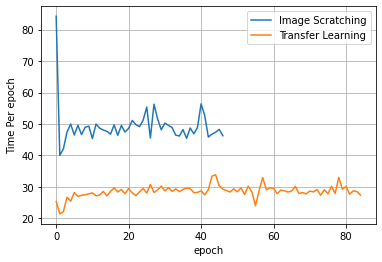

<Figure size 432x288 with 0 Axes>

In [32]:
#Comapre Time

%matplotlib inline

epochs=range(len(times)) # Get number of epochs

plt.plot(times)
plt.plot(times_transfer)
plt.ylabel('Time Per epoch')
plt.xlabel('epoch')
plt.legend(['Image Scratching', 'Transfer Learning'], loc='upper right')
plt.grid(axis = 'x')
plt.grid(axis = 'y')
plt.figure()
